Hackathon: #bdthackathon

Autor: Julio Abril Cuesta


# 1. Introducción.

Este notebook es solución propuesta para el reto de Barcelona Digital Talent (#BDTHackaton) en la modalidad de data science.

Tenemos un conjunto de datos que representan las lecturas de los sensores del LHC (large hadron collider) cuando se produce una colisión de partículas y la partícula que se produce como consecuencia de esa colisión.

El objetivo del reto es **generar un algoritmo de machine learning** que ayude a **predecir que partícula** se ha producido después de una colisión de hadrones **a partir de la información recogida por los sensores del LHC**.


---


In [98]:
## Carga librerías


## Tratamiento de datos
##----------------------------------------------------------------
import pandas as pd
import numpy as np

import missingno as msno 

import pandas_profiling as pp

## Visualización de datos
##----------------------------------------------------------------
%matplotlib inline
import matplotlib.pyplot as plt

import seaborn as sns

## Model selection
##----------------------------------------------------------------
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold, cross_val_score 
from sklearn.feature_selection import RFECV, SelectKBest, RFE

## Preprocesing
##----------------------------------------------------------------
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer, KNNImputer

## Linear Models
##----------------------------------------------------------------
from sklearn.linear_model import LogisticRegression

from sklearn.neighbors import KNeighborsClassifier

from sklearn.tree import DecisionTreeClassifier

## Ensemble
##----------------------------------------------------------------
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

import xgboost as xgb 

from sklearn.pipeline import Pipeline

## Model evaluation
##----------------------------------------------------------------
from sklearn.metrics import f1_score, classification_report


## Imbalanced Learning
##----------------------------------------------------------------
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTETomek, SMOTEENN


import optuna

from joblib import dump, load


# 2. Análisis exploratorio.

## 2.1. Carga del dataset.

Cargo el dataset del repositorio de github

In [82]:
# Carga del dataset

df = pd.read_csv('https://raw.githubusercontent.com/nuwe-io/bdt_hackathon/main/particles.csv')

In [83]:
# Información df
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 127321 entries, 0 to 127320
Data columns (total 12 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   alpha_1   109132 non-null  float64
 1   alpha_2   127321 non-null  float64
 2   alpha_3   127321 non-null  float64
 3   beta_1    127321 non-null  float64
 4   beta_2    127131 non-null  float64
 5   beta_3    127206 non-null  float64
 6   gamma_1   127321 non-null  float64
 7   gamma_2   126594 non-null  float64
 8   gamma_3   117897 non-null  float64
 9   theta     126595 non-null  float64
 10  noise     127321 non-null  float64
 11  Particle  127321 non-null  int64  
dtypes: float64(11), int64(1)
memory usage: 11.7 MB


In [4]:
df.head()

,alpha_1,alpha_2,alpha_3,beta_1,beta_2,beta_3,gamma_1,gamma_2,gamma_3,theta,noise,Particle
0,NaN,-59.730861,396.928620,9.761703,-137.558889,159.598109,-137.558889,53.930955,154.713810,-232.436087,99.243140,3
1,147.781782,153.729532,111.998962,-174.941235,-97.888332,26.493593,-97.888332,-30.506871,-166.347802,-195.010710,20.242743,0
2,242.220616,82.947635,-102.073856,116.334349,-101.746729,176.452823,-101.746729,-33.419984,44.082548,-173.928682,3.806943,1
3,140.542086,-110.129037,215.560355,-11.927860,-11.257902,21.648833,-11.257902,240.685680,133.441269,-276.382025,0.336025,0
4,169.367809,-92.182925,159.995515,-272.230740,-80.483153,-97.698901,-80.483153,16.251613,-13.177148,-100.316959,24.459551,0


---

## 2.2. Análisis exploratorio.

La librería pandas profilling nos permite obtener de manera sencilla un informe con los valores estadísticos de nuestro dataset. A continuación ejecuto el código necesario:

---

In [6]:
# Genero profile report

df_report = pp.ProfileReport(df,
                             title = 'Dataset lecturas de sensores - LHC',
                             explorative = True)
df_report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

---

_(En ocasiones pandas profilling da algún error en google colab, así que incluiré algunos gráficos que se pueden encontrar en el report de pandas profilling para dar soporte a la hora de visualizar nuestros datos)_

### 2.2.1. Análisis univariable.

- Tenemos un dataset con 11 variables (features) numéricas que representan información sobre la lectura de los sensores y un campo objetivo (target) categórico con 8 clases que nos indica que partícula hemos obtenido en el esperimento.

- El dataset tiene 127.321 observaciones y no se observan campos duplicados.

---

In [15]:
# Registros duplicados
df[df.duplicated()].sum()

alpha_1     0.0
alpha_2     0.0
alpha_3     0.0
beta_1      0.0
beta_2      0.0
beta_3      0.0
gamma_1     0.0
gamma_2     0.0
gamma_3     0.0
theta       0.0
noise       0.0
Particle    0.0
dtype: float64

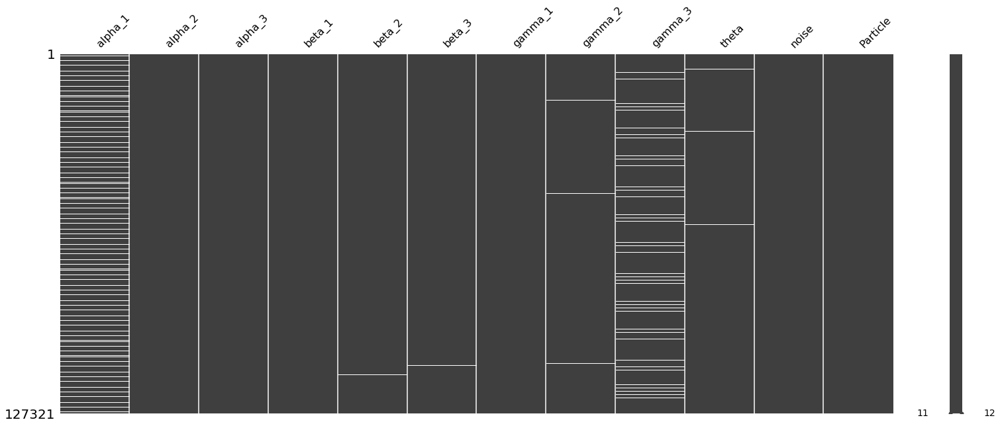

In [7]:
# Valores nulos
msno.matrix(df);

In [12]:
# Total de valores nulos por variable
df.isna().sum()

alpha_1     18189
alpha_2         0
alpha_3         0
beta_1          0
beta_2        190
beta_3        115
gamma_1         0
gamma_2       727
gamma_3      9424
theta         726
noise           0
Particle        0
dtype: int64

---

- Hay 29.371 valores nulos a los largo de nuestras features. *alpha_1* y *gamma_3* son las variables con mayor proporción de valores nulos (14% y 7% respectivamente) y  *beta_2, beta_3, gamma_2 y theta* también presentan valores nulos aunque en menor medida.

A continuación vemos como son las distribuciones de nuestras variables.

---

In [5]:
df.describe()

,alpha_1,alpha_2,alpha_3,beta_1,beta_2,beta_3,gamma_1,gamma_2,gamma_3,theta,noise,Particle
count,109132.000000,127321.000000,127321.000000,127321.000000,127131.000000,127206.000000,127321.000000,126594.000000,117897.000000,126595.000000,127321.000000,127321.000000
mean,-10.713873,-0.270224,49.546923,7.508049,46.853638,0.451485,46.845556,-0.040888,-20.881407,-61.594057,50.126020,1.647804
std,152.987128,100.044696,221.503776,164.993428,160.134335,99.979061,160.142626,99.797656,160.637008,146.954921,28.848755,1.470649
min,-779.841923,-391.102365,-1263.945127,-701.930722,-655.626984,-448.118855,-655.626984,-435.684650,-719.937495,-653.437102,0.000390,0.000000
25%,-118.765902,-68.036224,-102.428650,-109.328232,-59.311413,-66.838936,-59.320379,-67.011881,-133.157334,-158.912087,25.125602,0.000000
50%,-0.787086,-0.112444,48.483502,6.053932,55.785954,0.571383,55.772838,-0.265758,-14.309868,-75.169482,50.213148,2.000000
75%,101.815933,66.895676,198.157415,123.154096,155.939039,67.675433,155.939228,66.893239,95.426099,20.771011,75.115084,2.000000
max,698.044837,444.209708,1383.265329,666.078562,726.063419,448.925730,726.063419,544.546234,682.413287,689.548943,99.993348,7.000000


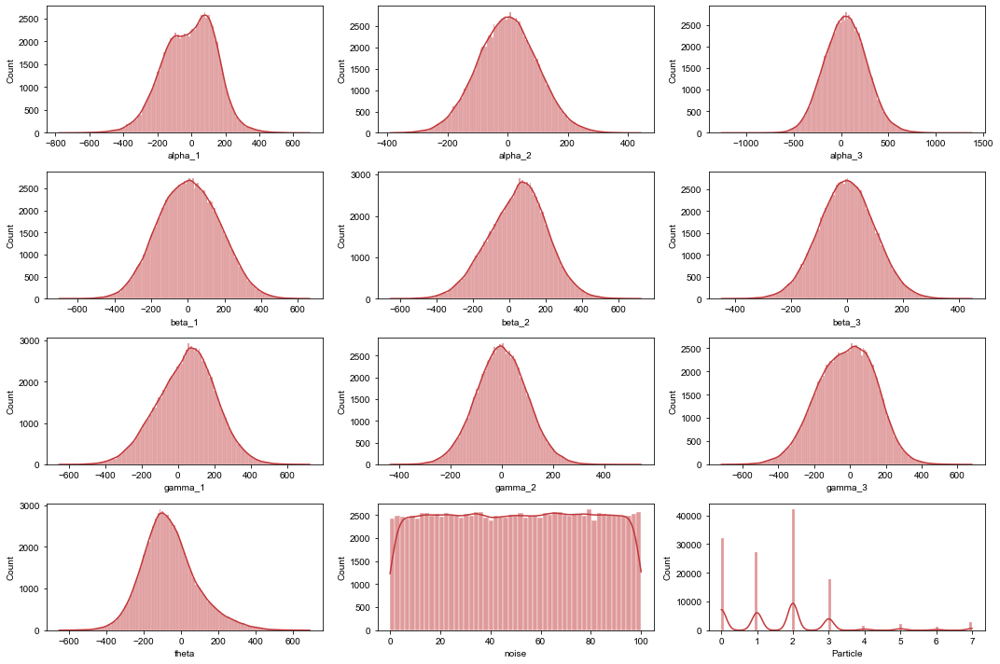

In [13]:
# Visualización Histogramas 
filas=4
columnas=3

# Creación Figuras, axes y estilo.
fig, axes = plt.subplots(filas, columnas, figsize=(15, 10),tight_layout=True)
sns.set_style("darkgrid")
sns.set_palette('RdGy')

# Plot histogramas
for i in range(filas):
    for j in range(columnas):
        var=(+j)+(i*columnas)
        sns.histplot(ax = axes[i, j], 
                     data = df,  
                     x = df.columns[var],
                     kde = True,
                     alpha = 0.5)
        

---

- Si observamos la distribución de cada variable, podemos decir que todas la variables menos _noise_ tienen valores de kurtosis y asimetría (skewness) muy próximos a cero.

- El rango de las variables está en una escala de valores bastante similar.

- La variable ruido se asemeja a una distribución uniforme entre 0 y 100.

- _Particle_ es nuestra target o variable independiente. Es una variable categórica con 8 clases, si observamos la distribución de las clases vemos que **no está balanceada** donde tenemos las clases 0,1,2 y 3 como mayoritarias que suponen un 93.7 % del total de observaciones. 

---

In [21]:
# Distribucion del %clases en el dataset
(df.Particle.value_counts(normalize=True)*100).round(2).sort_index()

0    25.29
1    21.47
2    33.03
3    13.92
4     1.34
5     1.78
6     0.92
7     2.24
Name: Particle, dtype: float64

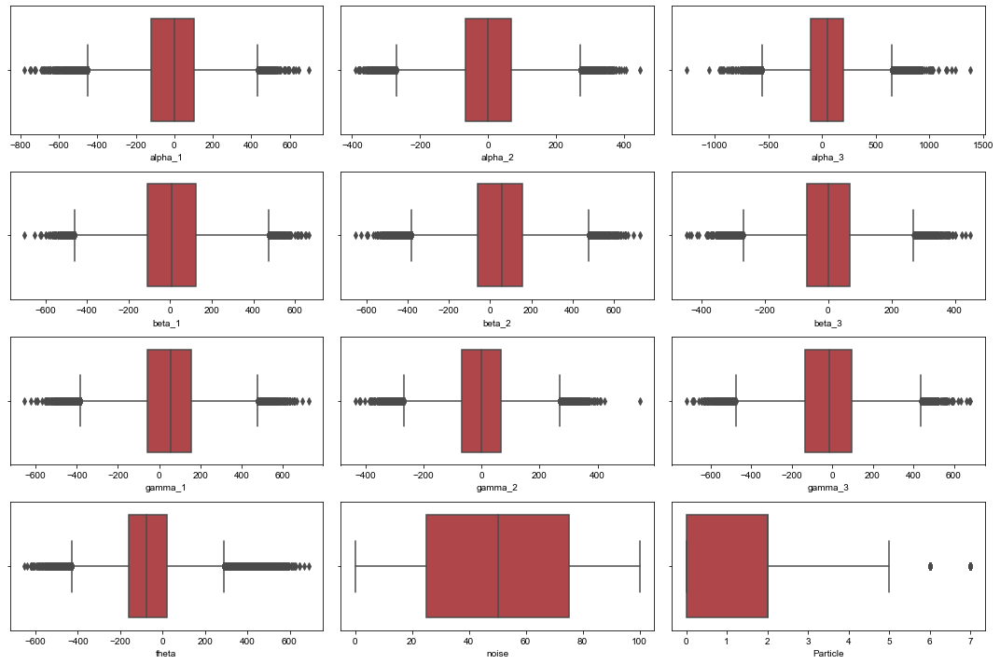

In [7]:
#sns.boxplot(df)
filas=4
columnas=3

# Creación Figuras, axes y estilo.
fig, axes = plt.subplots(filas, columnas, figsize=(15, 10),tight_layout=True)
sns.set_style("darkgrid")
sns.set_palette('RdGy')

# Plot histogramas
for i in range(filas):
    for j in range(columnas):
        var=(+j)+(i*columnas)
        sns.boxplot(ax = axes[i, j], 
                     data = df,  
                     x = df.columns[var],)

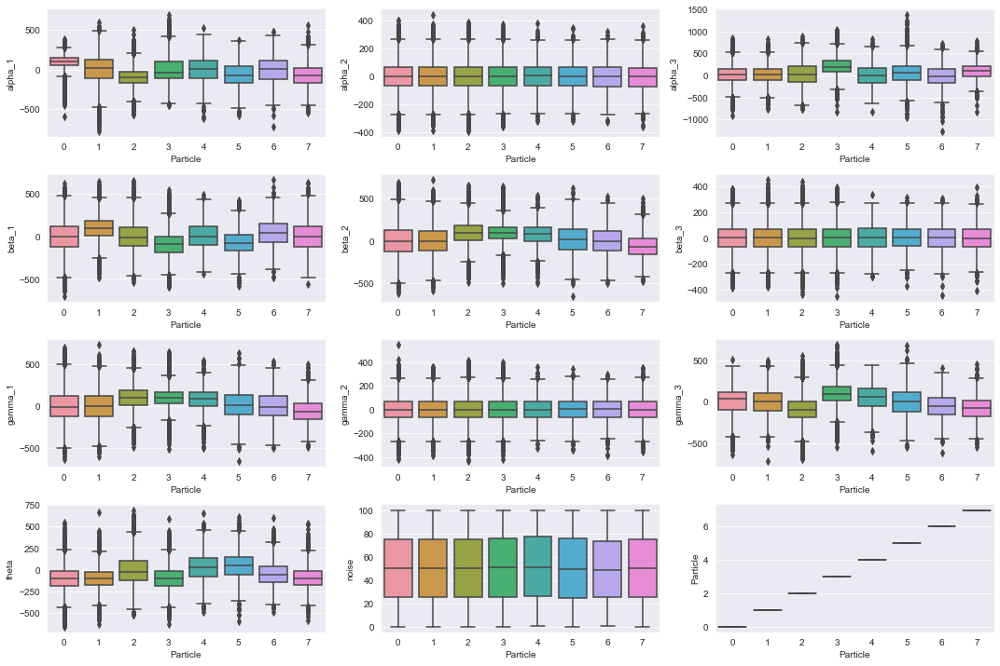

In [9]:
#sns.boxplot(df)
filas=4
columnas=3

# Creación Figuras, axes y estilo.
fig, axes = plt.subplots(filas, columnas, figsize=(15, 10),tight_layout=True)
sns.set_style("darkgrid")
sns.set_palette('RdGy')

# Plot histogramas
for i in range(filas):
    for j in range(columnas):
        var=(+j)+(i*columnas)
        sns.boxplot(ax = axes[i, j], 
                     data = df,  
                     y = df.columns[var],
                     x = 'Particle')
        


---

### 2.2.2. Análisis multivariable.

Relativo a la correlación entre variables, podemos ver la matriz de correlación:

---

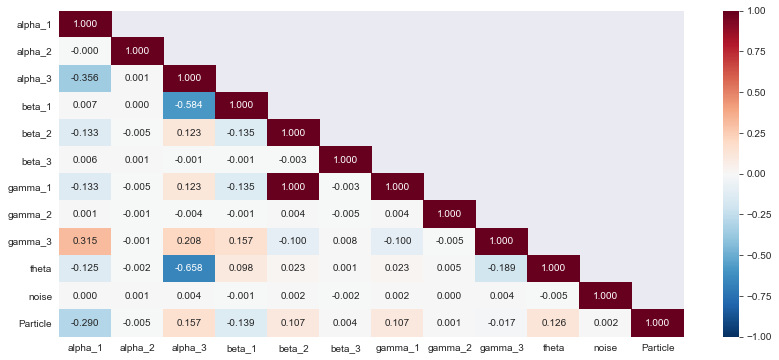

In [16]:
# Matriz de correlación de las variables numéricas
#---------------------------------------------------------------------------
fig, axes = plt.subplots(figsize=(14, 6))

sns.heatmap(df.corr(),
           vmin=-1.0,
           vmax=1.0,
           annot=True, fmt='.3f',
           mask=np.tri(len(df.corr()),len(df.corr()),k=-1,dtype=bool).T,
           cmap='RdBu_r');

--- 

- *gamma_1* y *beta_2* tienen una correlación cercana a 1. De hecho si comparamos los valores uno a uno ambas variables son iguales en 127.131 observaciones. Es decir, siempre que se recoge un valor de beta_2 éste es igual al valor de gamma_1.


---

In [16]:
# Total de valores de gamma_1 y beta_2 
(df.gamma_1 == df.beta_2).sum()

127131

---

- *alpha_3* presenta una correlación negativa media con *theta* y *beta_1* y una correlación negativa baja con *alpha_1*.

---

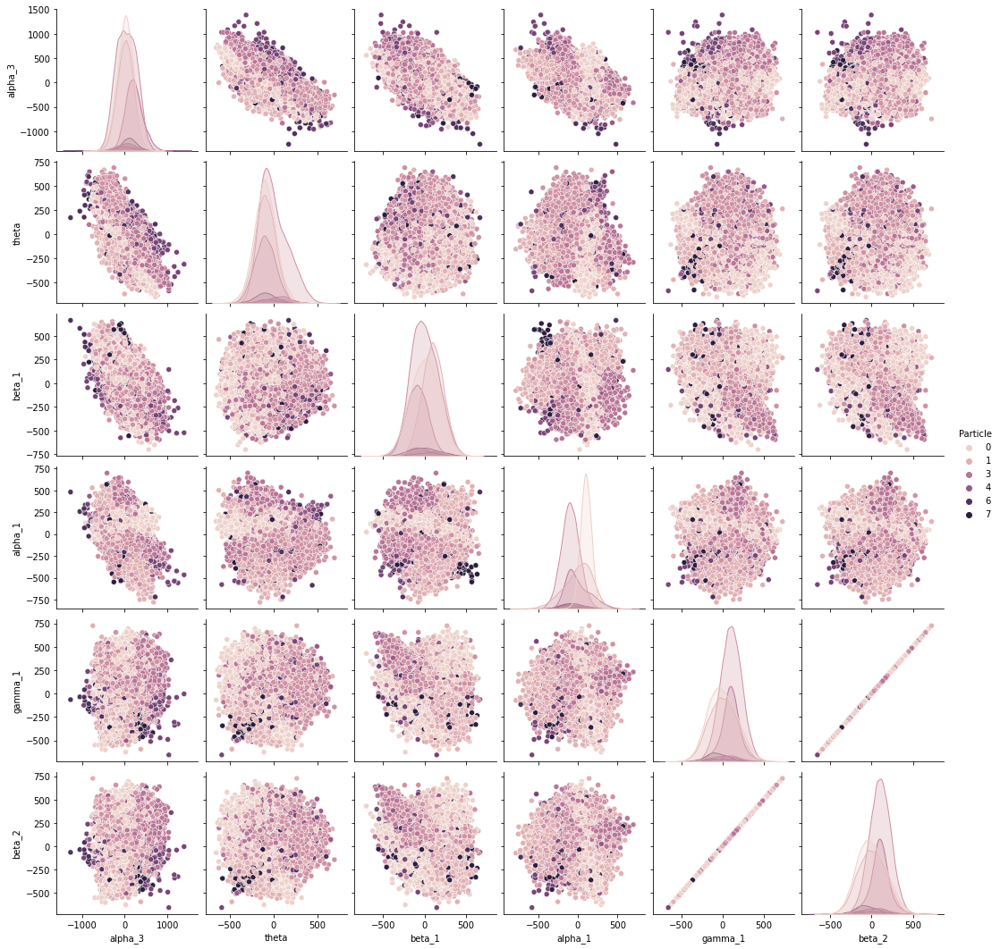

In [8]:
# Conjunto de representacioes de las variables con mayor correlación

sns.pairplot(df[['alpha_3','theta','beta_1','alpha_1','gamma_1','beta_2','Particle']],
            hue = 'Particle');

---

# 3. Modelado y entrenamiento.

Voy a probar la implantación de la librería optuna para optimizar los hiperparámetros.

In [72]:
#df.dropna(inplace=True)

In [84]:
df.shape

(127321, 12)



## 3.1. Preparación del dataset para entrenar.

En primer lugar divido el dataset en una parte de entrenamiento y otra de test. Voy a hacer una división 80/20.

---

In [74]:
# División train / test
df_train, df_test = train_test_split(df,
                                     test_size = 0.2,
                                     random_state = 1984,
                                     stratify = df.Particle)


In [50]:
# Muestra para fase de preselección
df_sample = df_train.sample(frac=0.1, random_state = 1984)

In [51]:
# Distribución de las clases en la muestra
df_sample.Particle.value_counts(normalize=True).sort_index()

0    0.259954
1    0.211715
2    0.327718
3    0.137698
4    0.013655
5    0.018632
6    0.010209
7    0.020419
Name: Particle, dtype: float64

--- 

Voy ahora a preparar _features y target_ para el entrenamiento.

Como *gamma_1 y beta_2* erán completamente iguales voy a retirar del modelo *beta_2*.

---


In [92]:
# Preparación de features y target.
X_train = df_train.drop(columns = ['Particle','gamma_1',
                                  # 'gamma_2', 'noise', 'beta_3', 'alpha_2',
                                  ])
y_train = df_train.Particle

In [93]:
X_train.shape

(78360, 10)

In [86]:
# Verifico como ha dividido train_test_split el dataset
y_train.value_counts(normalize=True).sort_index()

0    0.253726
1    0.214676
2    0.330590
3    0.138540
4    0.013132
5    0.017828
6    0.009137
7    0.022371
Name: Particle, dtype: float64

In [62]:
# Optuna wrapper to optimize 
def objective(trial):
    clf_name = trial.suggest_categorical('clf',['KNN', 'Log_Reg'])
    
    if clf_name == 'KNN':
        kbest = trial.suggest_int('k',1,10)
        neighbors = trial.suggest_int('n_neighbors',3,75, step=2)
        weights_param = trial.suggest_categorical('weights',['uniform','distance'])
        
        clf_object = Pipeline(steps=[('KNNimputer', SimpleImputer()),
                                     ('Scaling', StandardScaler()),
                                     ('Kbest',SelectKBest(k=kbest)),
                                     ('KNN', KNeighborsClassifier(n_neighbors=neighbors,
                                                                  weights=weights_param)),
                                    ])
    else:
        clf_object = Pipeline(steps=[('SimpleImputer', SimpleImputer()),
                                     ('Scaling', StandardScaler()),
                                     ('Log_reg',LogisticRegression(max_iter = 500))
                                    ])
    
    folds = StratifiedKFold(n_splits=5,)
    score = cross_val_score(clf_object,
                            X=X_train, 
                            y=y_train, 
                            scoring='f1_macro',
                            cv=folds)

    return score.mean()
        


In [104]:
# Optuna wrapper to optimize 
def objective(trial):
   # kbest = trial.suggest_int('k',1,10)
    neighbors = trial.suggest_int('n_neighbors',3,75, step=2)
    weights_param = trial.suggest_categorical('weights',['uniform','distance'])
        
    clf_object = Pipeline(steps=[('KNNimputer', SimpleImputer()),
                                 ('Scaling', StandardScaler()),
                                 ('RFC',RFECV(estimator=DecisionTreeClassifier())),
                                 ('KNN', KNeighborsClassifier(n_neighbors=neighbors,
                                                              weights=weights_param)),
                                    ])
    
    folds = StratifiedKFold(n_splits=5,)
    score = cross_val_score(clf_object,
                            X=X_train, 
                            y=y_train, 
                            scoring='f1_macro',
                            cv=folds)

    return score.mean()
        


In [105]:
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50, show_progress_bar=True)

[I 2021-06-23 17:14:00,400] A new study created in memory with name: no-name-feac32e0-a772-4517-86b0-31e3f21d837a
C:\Users\iukan\anaconda3\lib\site-packages\optuna\progress_bar.py:47: ExperimentalWarning: Progress bar is experimental (supported from v1.2.0). The interface can change in the future.
  self._init_valid()


  0%|          | 0/50 [00:00<?, ?it/s]

[I 2021-06-23 17:16:15,416] Trial 0 finished with value: 0.5798713024292321 and parameters: {'n_neighbors': 9, 'weights': 'uniform'}. Best is trial 0 with value: 0.5798713024292321.
[I 2021-06-23 17:18:32,120] Trial 1 finished with value: 0.5446637807326625 and parameters: {'n_neighbors': 33, 'weights': 'uniform'}. Best is trial 0 with value: 0.5798713024292321.
[I 2021-06-23 17:20:57,804] Trial 2 finished with value: 0.5390555268291572 and parameters: {'n_neighbors': 53, 'weights': 'distance'}. Best is trial 0 with value: 0.5798713024292321.
[I 2021-06-23 17:23:28,678] Trial 3 finished with value: 0.5189298221982885 and parameters: {'n_neighbors': 75, 'weights': 'distance'}. Best is trial 0 with value: 0.5798713024292321.
[I 2021-06-23 17:26:06,953] Trial 4 finished with value: 0.5177633474526545 and parameters: {'n_neighbors': 75, 'weights': 'distance'}. Best is trial 0 with value: 0.5798713024292321.
[I 2021-06-23 17:28:34,885] Trial 5 finished with value: 0.5831686355041769 and par

[I 2021-06-23 19:00:16,928] Trial 42 finished with value: 0.5800527082317558 and parameters: {'n_neighbors': 17, 'weights': 'distance'}. Best is trial 41 with value: 0.5911232006337854.
[I 2021-06-23 19:02:36,521] Trial 43 finished with value: 0.5894693799464733 and parameters: {'n_neighbors': 7, 'weights': 'distance'}. Best is trial 41 with value: 0.5911232006337854.
[I 2021-06-23 19:04:55,855] Trial 44 finished with value: 0.5911232006337854 and parameters: {'n_neighbors': 7, 'weights': 'distance'}. Best is trial 41 with value: 0.5911232006337854.
[I 2021-06-23 19:07:15,656] Trial 45 finished with value: 0.5913573948699004 and parameters: {'n_neighbors': 7, 'weights': 'distance'}. Best is trial 45 with value: 0.5913573948699004.
[I 2021-06-23 19:09:34,778] Trial 46 finished with value: 0.5843468790086161 and parameters: {'n_neighbors': 13, 'weights': 'distance'}. Best is trial 45 with value: 0.5913573948699004.
[I 2021-06-23 19:11:53,695] Trial 47 finished with value: 0.5929452541742

In [107]:
study.best_value

0.5929452541742093

In [108]:
study.best_trial

FrozenTrial(number=47, values=[0.5929452541742093], datetime_start=datetime.datetime(2021, 6, 23, 19, 9, 34, 780665), datetime_complete=datetime.datetime(2021, 6, 23, 19, 11, 53, 695728), params={'n_neighbors': 5, 'weights': 'distance'}, distributions={'n_neighbors': IntUniformDistribution(high=75, low=3, step=2), 'weights': CategoricalDistribution(choices=('uniform', 'distance'))}, user_attrs={}, system_attrs={}, intermediate_values={}, trial_id=47, state=TrialState.COMPLETE, value=None)

In [109]:
study.best_params

{'n_neighbors': 5, 'weights': 'distance'}